# Remote Voice-Controlled Robot
Team John Cena




Are you ready for the demonstration THIS SATURDAY! Team John Cena is preparing to bring the Smack-down, with their voice automated battle-bot. 

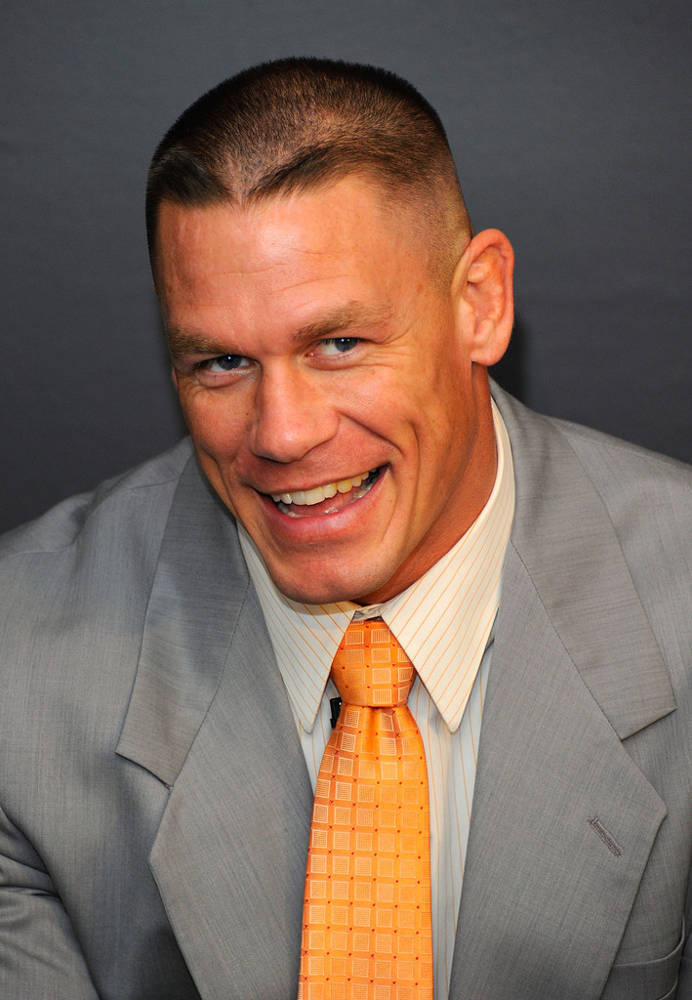

Meet the team!

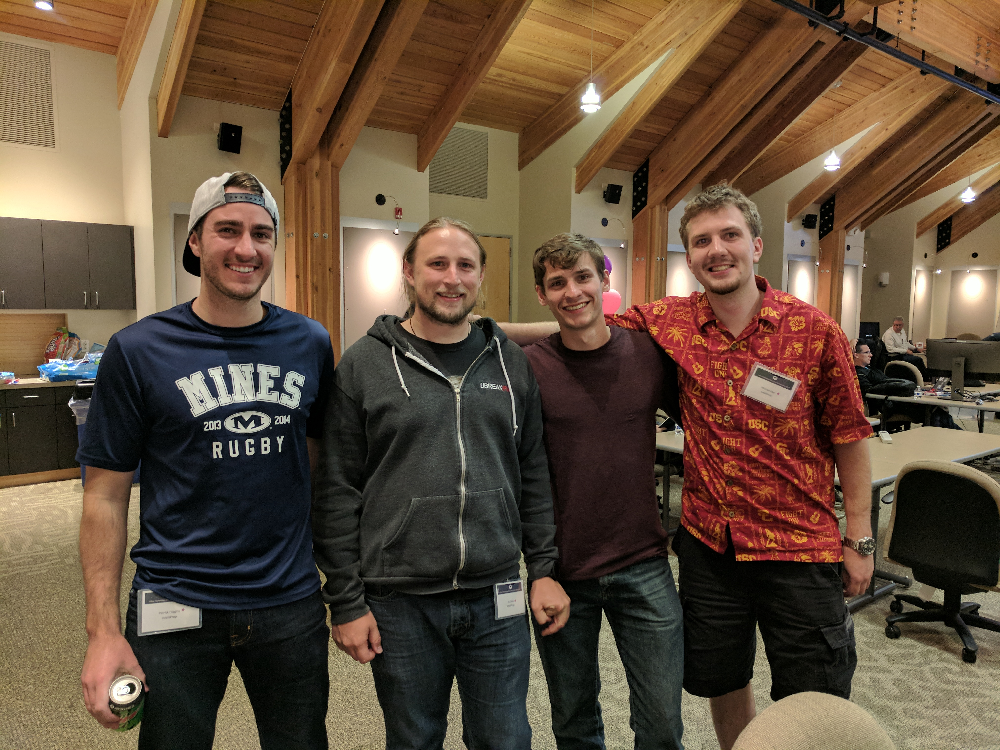

Below, their code will immobilize all contestants, sending them to their parents in tears. Read at your own peril!


In [2]:
# import motor as my_motor
from motor import motor
import speech_recognition as sr
from os import path
from subprocess import check_call
import time
import numpy as np
import sys
# from time import sleep

from pynq.overlays.base import BaseOverlay
base = BaseOverlay("base.bit")
pAudio = base.audio

my_string = ""
my_motor = motor()
r = sr.Recognizer()
r.pause_threshold = 0.3
r.operation_time = 10
my_list = []

exit = 0
exit_done = 0
default_duration = 10
while not exit_done:
    try:
        check_call(["test", "-f", "/home/xilinx/wav_copied.txt"])
        print("TEST")
        
        with sr.AudioFile("/home/xilinx/test.wav") as source:
            rec_audio = r.record(source, duration=1)
        try:
            my_string += r.recognize_sphinx(rec_audio,
                                           keyword_entries=[("left", 1.0),
                                           ("right", 1.0),
                                           ("backward", 1.0),
                                           ("forward", 1.0),
                                           ("exit", 1.0)])
        except sr.UnknownValueError:
            print("Sphinx could not understand audio")
        except sr.RequestError as e:
            print("Sphinx error; {0}".format(e))
        check_call(["rm", "/home/xilinx/wav_copied.txt"])
        time.sleep(0.25)
        
    except:
        print("Collision avoided")
        time.sleep(2.0)
        
    if not my_string:
        continue
    
    
    with sr.AudioFile("voice_commands.wav") as source:
        audio_en = r.record(source)
    my_string += r.recognize_google(audio_en)
    print ("Recognized \"",my_string,"\"")
#     if not my_string:
#         continue
    
    my_list = my_string.split()



TEST
Sphinx could not understand audio
Collision avoided
Collision avoided
Collision avoided
Collision avoided
Collision avoided
Collision avoided
Collision avoided
Collision avoided
TEST
Recognized " right forward left backwards right stop exit "
RIGHT FLANK!
FORWARDS MARCH!
LEFT FLANK!
BACK IT UP Y'ALL!
RIGHT FLANK!
STOPPING!
EXIT!
right forward left backwards right stop exit


Tearing it up with the robot!

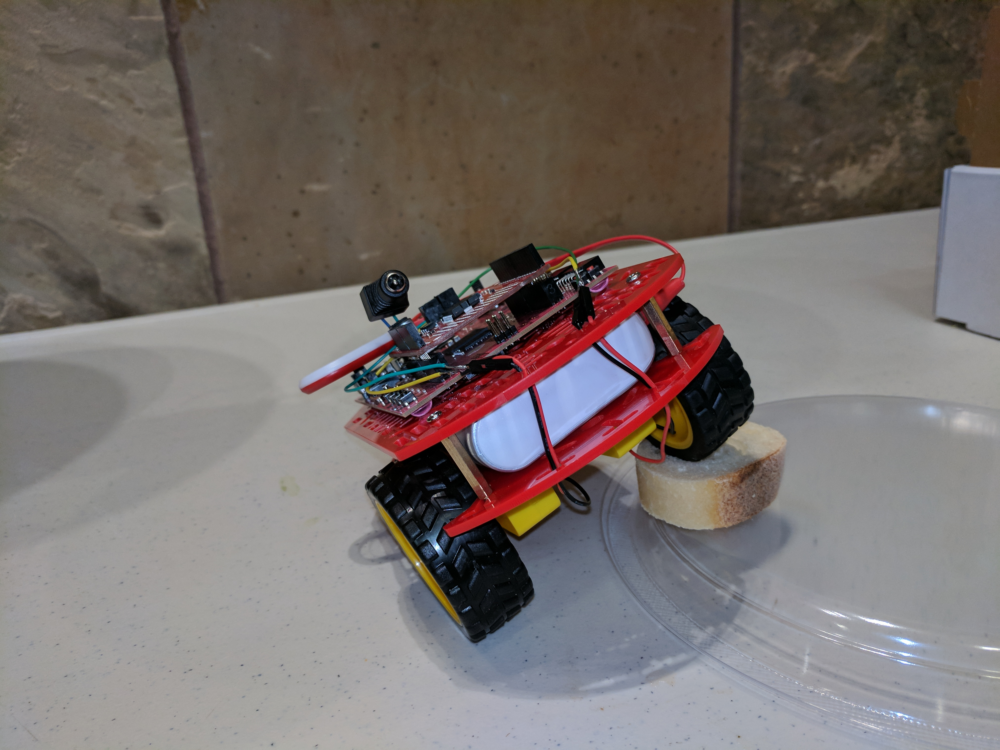

In [ ]:
    for i in my_list:
        # DO OPERATION
        if i == "forward":
            print("FORWARDS MARCH!")
            my_motor.forward(default_duration)
            ## DO FORWARD
        elif i == "backwards":
            print("BACK IT UP Y'ALL!")
            my_motor.backward(default_duration)
            ## DO BACKWARDS
        elif i == "left":
            print("LEFT FLANK!")
            my_motor.turn_left(default_duration)
            ## DO LEFT
        elif i == "right":
            print("RIGHT FLANK!")
            my_motor.turn_right(default_duration)
            ## DO RIGHT
        elif i == "stop":
            print("STOPPING!")
            my_motor.stop()
            ## stop
        elif i == "exit":
            print("EXIT!")
            exit_done=1
        else:
            print("Unrecognized")

print(my_string) 

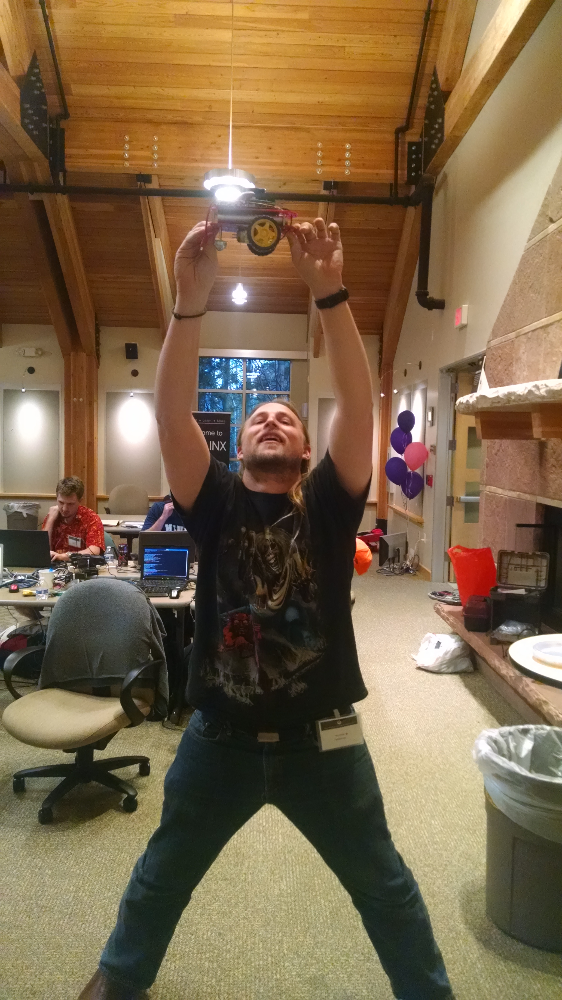

In [ ]:
import IPython
IPython.display.Audio("voice_commands.v")